In [1]:
# import dependencies
import numpy as np
import pandas as pd
import os
import darts
from darts import TimeSeries
from darts.models import AutoARIMA
from darts.metrics import mae, rmse
import plotly.graph_objects as go
from darts.utils.timeseries_generation import datetime_attribute_timeseries

f:\Semml\comparative-analysis-energy-timeseries-forecasting-semml\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Electrical Load

The term "BZN|DE-LU" refers to a **Bidding Zone** (BZN) in the European electricity market, specifically encompassing Germany (DE) and Luxembourg (LU). In this context, a Bidding Zone represents the largest geographical area within which market participants can exchange energy without the need for capacity allocation, ensuring a uniform spot price across the zone. 

Historically, there was a combined Bidding Zone known as "BZN|DE-AT-LU," which included Germany, Austria, and Luxembourg. However, starting from October 1, 2018, this zone was split into two separate Bidding Zones:

- **BZN|DE-LU**: Covering Germany and Luxembourg.

- **BZN|AT**: Covering Austria.

This restructuring aimed to enhance market efficiency and better reflect the physical characteristics of the electricity grid in these regions. 

For more detailed information on Bidding Zones and their configurations, you can refer to the ENTSO-E Transparency Platform's documentation.  

In [2]:
# Specify the folder path
folder_path = "Dataset"

# List to store individual DataFrames
dataframes = []

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(".csv"):  # Check if the file is a .csv file
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)  # Read the CSV file into a DataFrame
        dataframes.append(df)  # Add the DataFrame to the list

# Concatenate all DataFrames by rows
final_dataset = pd.concat(dataframes, axis=0, ignore_index=True)

# Save the concatenated dataset to a new CSV file (optional)
final_dataset.to_csv("final_dataset.csv", index=False)

print("Dataset created successfully!")

Dataset created successfully!


In [3]:
df = pd.read_csv("final_dataset.csv")
df.rename(
    columns={
        'Time (CET/CEST)' : "timestamp",
        'Day-ahead Total Load Forecast [MW] - BZN|DE-LU' : "Forecast [MW]",
        'Actual Total Load [MW] - BZN|DE-LU' : "Actual Load [MW]"
    }, inplace=True
)

In [4]:
df

,timestamp,Forecast [MW],Actual Load [MW]
0,01.01.2020 00:00 - 01.01.2020 00:15,46653.0,44358
1,01.01.2020 00:15 - 01.01.2020 00:30,46133.0,44110
2,01.01.2020 00:30 - 01.01.2020 00:45,45652.0,43795
3,01.01.2020 00:45 - 01.01.2020 01:00,45157.0,43611
4,01.01.2020 01:00 - 01.01.2020 01:15,44317.0,43472
...,...,...,...
174326,20.12.2024 21:30 - 20.12.2024 21:45,53708.0,54534
174327,20.12.2024 21:45 - 20.12.2024 22:00,52989.0,54029
174328,20.12.2024 22:00 - 20.12.2024 22:15,52267.0,53642
174329,20.12.2024 22:15 - 20.12.2024 22:30,51667.0,53049


In [5]:
# Convert 'timestamp' column to string and strip unnecessary parts
df['timestamp'] = df['timestamp'].str.split(' - ').str[0]

# Convert to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d.%m.%Y %H:%M')

# Display the updated DataFrame
df.head()

,timestamp,Forecast [MW],Actual Load [MW]
0,2020-01-01 00:00:00,46653.0,44358
1,2020-01-01 00:15:00,46133.0,44110
2,2020-01-01 00:30:00,45652.0,43795
3,2020-01-01 00:45:00,45157.0,43611
4,2020-01-01 01:00:00,44317.0,43472


In [6]:
# Set 'timestamp' as the index
df.set_index('timestamp', inplace=True)

# Resample the data by hour and calculate the mean for each column
df_resampled = df.resample('h').mean()
df_resampled

,Forecast [MW],Actual Load [MW]
timestamp,,
2020-01-01 00:00:00,45898.750000,43968.500000
2020-01-01 01:00:00,43864.250000,43047.000000
2020-01-01 02:00:00,42938.000000,41895.000000
2020-01-01 03:00:00,42835.750000,40701.750000
2020-01-01 04:00:00,42953.000000,40681.250000
...,...,...
2024-12-20 18:00:00,62943.000000,62401.250000
2024-12-20 19:00:00,60739.750000,60748.750000
2024-12-20 20:00:00,57387.750000,57554.000000


# Weather data

The latitude, longitude, and elevation data for major German cities were compiled from various sources, including:

LatLong.net: Provides latitude and longitude coordinates for cities worldwide. 
LATLONG

Maps of World: Offers latitude and longitude information for Germany. 
MAPS OF WORLD

SimpleMaps.com: Contains a database of prominent German cities with their geographic coordinates. 
SIMPLE MAPS

Wikipedia: Lists elevations for various cities globally, including some in Germany. 
WIKIPEDIA

In [7]:
from meteostat import Point, Hourly
import pandas as pd
from datetime import datetime

# Define the city (latitude, longitude, and elevation for Berlin as an example)
city = Point(52.5200, 13.4050, 34)

# Define the time period
# Set time period
start = datetime(2020, 1, 1)
end = datetime(2024, 12, 31)

# Fetch hourly weather data
data = Hourly(city, start, end, timezone='UTC')
data = data.fetch()

# Save to CSV
# data.to_csv("berlin_weather.csv")
print("Weather data saved to berlin_weather.csv")
data

Weather data saved to berlin_weather.csv


,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
time,,,,,,,,,,,
2020-01-01 00:00:00+00:00,2.9,0.5,84.0,0.0,0.0,280.0,13.0,24.1,1033.3,0.0,2.0
2020-01-01 01:00:00+00:00,2.5,0.2,85.0,0.0,NaN,277.0,13.0,24.1,1033.4,0.0,2.0
2020-01-01 02:00:00+00:00,2.2,0.3,87.0,0.0,NaN,272.0,11.1,22.2,1033.4,0.0,2.0
2020-01-01 03:00:00+00:00,1.6,0.0,89.0,0.0,NaN,272.0,11.1,20.4,1033.3,0.0,1.0
2020-01-01 04:00:00+00:00,1.4,0.1,91.0,0.0,NaN,269.0,11.1,20.4,1033.3,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...
2024-12-30 20:00:00+00:00,3.9,2.3,89.0,NaN,NaN,268.0,14.8,29.6,1026.2,NaN,4.0
2024-12-30 21:00:00+00:00,3.9,2.3,89.0,NaN,NaN,269.0,14.8,29.6,1026.2,NaN,4.0
2024-12-30 22:00:00+00:00,3.7,2.2,90.0,NaN,NaN,267.0,13.0,29.6,1024.3,NaN,4.0


In [8]:
germany_cities_data = {
    "Berlin": {"latitude": 52.5200, "longitude": 13.4050, "elevation": 34},
    "Hamburg": {"latitude": 53.5511, "longitude": 9.9937, "elevation": 6},
    "Munich": {"latitude": 48.1351, "longitude": 11.5820, "elevation": 519},
    "Cologne": {"latitude": 50.9375, "longitude": 6.9603, "elevation": 37},
    "Frankfurt": {"latitude": 50.1109, "longitude": 8.6821, "elevation": 112},
    "Stuttgart": {"latitude": 48.7758, "longitude": 9.1829, "elevation": 247},
    "Düsseldorf": {"latitude": 51.2277, "longitude": 6.7735, "elevation": 38},
    "Dortmund": {"latitude": 51.5136, "longitude": 7.4653, "elevation": 86},
    "Leipzig": {"latitude": 51.3397, "longitude": 12.3731, "elevation": 118},
    "Dresden": {"latitude": 51.0504, "longitude": 13.7373, "elevation": 113},
    "Hannover": {"latitude": 52.3759, "longitude": 9.7320, "elevation": 55},
    "Nuremberg": {"latitude": 49.4521, "longitude": 11.0767, "elevation": 302},
    "Karlsruhe": {"latitude": 49.0069, "longitude": 8.4037, "elevation": 115},
    "Mannheim": {"latitude": 49.4875, "longitude": 8.4660, "elevation": 97},
    "Augsburg": {"latitude": 48.3705, "longitude": 10.8978, "elevation": 494},
    "Chemnitz": {"latitude": 50.8278, "longitude": 12.9214, "elevation": 300},
    "Aachen": {"latitude": 50.7753, "longitude": 6.0839, "elevation": 266},
    "Halle (Saale)": {"latitude": 51.4828, "longitude": 11.9690, "elevation": 87},
    "Magdeburg": {"latitude": 52.1205, "longitude": 11.6276, "elevation": 50},
    "Erfurt": {"latitude": 50.9848, "longitude": 11.0299, "elevation": 200},
    }

# Define the time period
# Set time period
start = datetime(2020, 1, 1)
end = datetime(2024, 12, 31)

for city, values in germany_cities_data.items():

    # Define the city (latitude, longitude, and elevation for Berlin as an example)
    city_point = Point(values["latitude"], values["longitude"], values["elevation"])

    # Fetch hourly weather data
    data = Hourly(city_point, start, end, timezone='UTC')
    data = data.fetch()

    # Save to CSV
    data.to_csv(f"weather/{city}_weather.csv")


print("Weather data saved")

Weather data saved


In [9]:
print("The number of cities taken into account are : ",len(germany_cities_data))

The number of cities taken into account are :  20


In [10]:
# Initialize an empty DataFrame to store the combined data
combined_data = pd.DataFrame()

# Define the path to the directory containing the weather CSV files
weather_directory = 'weather/'

# Iterate over each file in the directory
for filename in os.listdir(weather_directory):
    if filename.endswith('_weather.csv'):
        # Construct the full file path
        file_path = os.path.join(weather_directory, filename)
        
        # Read the CSV file into a DataFrame
        city_data = pd.read_csv(file_path)
        
        # Add a new column for the city name (extracted from the filename)
        city_name = filename.replace('_weather.csv', '')
        time_col = city_data["time"]
        city_data.drop(columns=['time'], inplace=True)
        # city_data['City'] = city_name
        # Rename the columns dynamically to include the city name
        city_data = city_data.rename(columns={
            'temp': f'{city_name}_temperature',
            'dwpt': f'{city_name}_dew_point',
            'rhum': f'{city_name}_humidity',
            'prcp': f'{city_name}_precipitation',
            'snow': f'{city_name}_snowfall',
            'wdir': f'{city_name}_wind_direction',
            'wspd': f'{city_name}_wind_speed',
            'wpgt': f'{city_name}_wind_peak',
            'pres': f'{city_name}_pressure',
            'tsun': f'{city_name}_sunshine_duration',
            'coco': f'{city_name}_cloud_cover',
        })
        
        # Append the city's data to the combined DataFrame
        combined_data = pd.concat([combined_data, city_data], axis=1)

# Convert the 'time' column to datetime format
combined_data['timestamp'] = time_col
combined_data.set_index('timestamp', inplace=True)

print("Combined weather data with averages has been saved.")

Combined weather data with averages has been saved.


In [11]:
weather_cols = ['temperature', 'humidity', 'wind_speed']
average_data = pd.DataFrame()
# average_data['timestamp'] = time_col
for col in weather_cols:
    feature = []
    for keys, _ in germany_cities_data.items():
        feature.append(f"{keys}_{col}")
    average_data[col] = combined_data[feature].mean(axis=1)

In [12]:
average_data.reset_index(inplace=True)

# Convert the 'timestamp' column to datetime (timezone-aware)
average_data['timestamp'] = pd.to_datetime(average_data['timestamp'])

# Convert the 'timestamp' column to naive (remove timezone)
average_data['timestamp'] = average_data['timestamp'].dt.tz_localize(None)

average_data.to_csv('weather/weather_data.csv', index=False)

In [13]:
average_data.set_index("timestamp", inplace=True)

In [14]:
Enriched_data = pd.concat([df_resampled, average_data], axis=1, join="inner")
Enriched_data

,Forecast [MW],Actual Load [MW],temperature,humidity,wind_speed
timestamp,,,,,
2020-01-01 00:00:00,45898.750000,43968.500000,1.400,88.45,7.795
2020-01-01 01:00:00,43864.250000,43047.000000,1.155,89.40,8.665
2020-01-01 02:00:00,42938.000000,41895.000000,0.940,89.35,8.850
2020-01-01 03:00:00,42835.750000,40701.750000,0.655,89.00,8.530
2020-01-01 04:00:00,42953.000000,40681.250000,0.435,89.55,8.625
...,...,...,...,...,...
2024-12-20 18:00:00,62943.000000,62401.250000,3.055,80.95,15.465
2024-12-20 19:00:00,60739.750000,60748.750000,2.865,81.40,15.830
2024-12-20 20:00:00,57387.750000,57554.000000,2.725,80.70,15.705


# Time related covariates

In [15]:
import holidays
Enriched_data.reset_index(inplace=True)
# Add time-related covariates
Enriched_data["dayofyear"] = Enriched_data['timestamp'].dt.dayofyear
Enriched_data["dayofmonth"] = Enriched_data['timestamp'].dt.day
Enriched_data["dayofweek"] = Enriched_data['timestamp'].dt.dayofweek  # 0 = Monday, 6 = Sunday
Enriched_data["hour"] = Enriched_data['timestamp'].dt.hour

# Add holiday information for Germany
german_holidays = holidays.Germany()
Enriched_data["holiday"] = Enriched_data['timestamp'].dt.date.apply(lambda x: 1 if x in german_holidays else 0)

In [16]:
Enriched_data

,timestamp,Forecast [MW],Actual Load [MW],temperature,humidity,wind_speed,dayofyear,dayofmonth,dayofweek,hour,holiday
0,2020-01-01 00:00:00,45898.750000,43968.500000,1.400,88.45,7.795,1,1,2,0,1
1,2020-01-01 01:00:00,43864.250000,43047.000000,1.155,89.40,8.665,1,1,2,1,1
2,2020-01-01 02:00:00,42938.000000,41895.000000,0.940,89.35,8.850,1,1,2,2,1
3,2020-01-01 03:00:00,42835.750000,40701.750000,0.655,89.00,8.530,1,1,2,3,1
4,2020-01-01 04:00:00,42953.000000,40681.250000,0.435,89.55,8.625,1,1,2,4,1
...,...,...,...,...,...,...,...,...,...,...,...
43578,2024-12-20 18:00:00,62943.000000,62401.250000,3.055,80.95,15.465,355,20,4,18,0
43579,2024-12-20 19:00:00,60739.750000,60748.750000,2.865,81.40,15.830,355,20,4,19,0
43580,2024-12-20 20:00:00,57387.750000,57554.000000,2.725,80.70,15.705,355,20,4,20,0
43581,2024-12-20 21:00:00,54075.250000,54761.500000,2.780,80.95,15.535,355,20,4,21,0


# Save the data

In [17]:
Enriched_data.to_csv('Enriched_data.csv', index=False)

In [18]:
df = pd.read_csv("Enriched_data.csv")
df.describe()

,Forecast [MW],Actual Load [MW],temperature,humidity,wind_speed,dayofyear,dayofmonth,dayofweek,hour,holiday
count,43533.000000,43583.000000,43583.000000,43583.000000,43583.000000,43583.000000,43583.000000,43583.000000,43583.000000,43583.000000
mean,54720.801698,55176.529929,11.434671,74.418125,12.437121,182.119381,15.672808,2.999977,11.499736,0.023679
std,9310.282308,9767.826521,7.425407,15.109451,5.247075,104.885531,8.789303,1.998663,6.922126,0.152049
min,30893.250000,31284.500000,-11.640000,17.800000,3.915000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,47106.250000,47231.750000,5.680000,65.250000,8.535000,91.000000,8.000000,1.000000,5.500000,0.000000
50%,54629.250000,55120.750000,10.960000,78.450000,11.225000,182.000000,16.000000,3.000000,11.000000,0.000000
75%,62389.500000,62686.875000,16.925000,86.200000,15.110000,273.000000,23.000000,5.000000,17.000000,0.000000
max,78154.250000,82115.750000,35.620000,97.650000,44.595000,366.000000,31.000000,6.000000,23.000000,1.000000


In [19]:
import plotly.graph_objects as go

# Create figure with secondary axis
fig = go.Figure()

df_plot = pd.read_csv("Enriched_data.csv")

# Add Forecast line (primary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['Actual Load [MW]'],
                         mode='lines', name='Actual Load [MW]'))


# Update layout for secondary y-axis
fig.update_layout(
    template='presentation',  # Dark background template
    title='Actual Load',
    xaxis_title='Time',
    yaxis_title='Actual Load [MW]',
    xaxis=dict(showgrid=True, gridcolor='gray'),
    yaxis=dict(showgrid=True, gridcolor='gray'),
    plot_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        x=0,  # X-position (0 is left, 1 is right)
        y=1.1,  # Y-position (1 is top, 0 is bottom)
        traceorder='normal',
        orientation='h',  # Horizontal orientation
        bgcolor='rgba(0, 0, 0, 0)',  # Transparent background for legend
    )
)

# Show the plot
fig.show()

In [20]:
import plotly.graph_objects as go

# Create figure with secondary axis
fig = go.Figure()

df_plot = pd.read_csv("Enriched_data.csv")

# Add Forecast line (primary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['Actual Load [MW]'],
                         mode='lines', name='Actual Load [MW]'))

# Add Actual Load line (secondary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['temperature'],
                         mode='lines', name='temperature',
                         yaxis='y2'))

# Update layout for secondary y-axis
fig.update_layout(
    template='presentation',  # Dark background template
    title=' Actual Load vs temperature',
    xaxis_title='Time',
    yaxis_title='Actual Load [MW]',
    yaxis2=dict(
        title='temperature',
        overlaying='y',
        side='right'
    ),
    xaxis=dict(showgrid=True, gridcolor='gray'),
    yaxis=dict(showgrid=True, gridcolor='gray'),
    plot_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        x=0,  # X-position (0 is left, 1 is right)
        y=1.1,  # Y-position (1 is top, 0 is bottom)
        traceorder='normal',
        orientation='h',  # Horizontal orientation
        bgcolor='rgba(0, 0, 0, 0)',  # Transparent background for legend
    )
)

# Show the plot
fig.show()

In [21]:
# Create figure with secondary axis
fig = go.Figure()

df_plot = pd.read_csv("Enriched_data.csv")

# Add Forecast line (primary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['Actual Load [MW]'],
                         mode='lines', name='Actual Load [MW]'))

# Add Actual Load line (secondary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['humidity'],
                         mode='lines', name='humidity',
                         yaxis='y2'))

# Update layout for secondary y-axis
fig.update_layout(
    template='presentation',  # Dark background template
    title=' Actual Load vs humidity',
    xaxis_title='Time',
    yaxis_title='Actual Load [MW]',
    yaxis2=dict(
        title='humidity',
        overlaying='y',
        side='right'
    ),
    xaxis=dict(showgrid=True, gridcolor='gray'),
    yaxis=dict(showgrid=True, gridcolor='gray'),
    plot_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        x=0,  # X-position (0 is left, 1 is right)
        y=1.1,  # Y-position (1 is top, 0 is bottom)
        traceorder='normal',
        orientation='h',  # Horizontal orientation
        bgcolor='rgba(0, 0, 0, 0)',  # Transparent background for legend
    )
)

# Show the plot
fig.show()

In [22]:
# Create figure with secondary axis
fig = go.Figure()

df_plot = pd.read_csv("Enriched_data.csv")

# Add Forecast line (primary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['Actual Load [MW]'],
                         mode='lines', name='Actual Load [MW]'))

# Add Actual Load line (secondary y-axis)
fig.add_trace(go.Scatter(x=df_plot['timestamp'], y=df_plot['wind_speed'],
                         mode='lines', name='wind_speed',
                         yaxis='y2'))

# Update layout for secondary y-axis
fig.update_layout(
    template='presentation',  # Dark background template
    title=' Actual Load vs wind_speed',
    xaxis_title='Time',
    yaxis_title='Actual Load [MW]',
    yaxis2=dict(
        title='wind_speed',
        overlaying='y',
        side='right'
    ),
    xaxis=dict(showgrid=True, gridcolor='gray'),
    yaxis=dict(showgrid=True, gridcolor='gray'),
    plot_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        x=0,  # X-position (0 is left, 1 is right)
        y=1.1,  # Y-position (1 is top, 0 is bottom)
        traceorder='normal',
        orientation='h',  # Horizontal orientation
        bgcolor='rgba(0, 0, 0, 0)',  # Transparent background for legend
    )
)

# Show the plot
fig.show()

In [23]:
df.columns

Index(['timestamp', 'Forecast [MW]', 'Actual Load [MW]', 'temperature',
       'humidity', 'wind_speed', 'dayofyear', 'dayofmonth', 'dayofweek',
       'hour', 'holiday'],
      dtype='object')

# Correlation and mutual information

In [24]:
import pandas as pd
import plotly.graph_objects as go

# Read the data
df = pd.read_csv("Enriched_data.csv")

# Compute correlation for the selected features
simple_corr = df[['Actual Load [MW]', 'temperature', 'humidity', 'wind_speed']].corr()

# Prepare data for plotting with annotations
correlation_data = [
    go.Heatmap(
        z=simple_corr.values,
        x=simple_corr.columns,
        y=simple_corr.index,
        colorscale='Viridis',
        text=simple_corr.round(2).values,  # Annotate with rounded correlation values
        texttemplate="%{text}",  # Template to show the annotation text
        textfont={"size": 12},  # Font size for annotations
        name="Simple Resolution"
    ),
]

# Layout with subplots
layout = go.Layout(
    title='Correlation Between Features',
    xaxis=dict(title="Features"),
    yaxis=dict(title="Features"),
    template='plotly_white'
)

# Create the figure
fig = go.Figure(data=correlation_data, layout=layout)

# Show the plot
fig.show()


In [25]:
import pandas as pd
from sklearn.feature_selection import mutual_info_regression
import plotly.express as px

# Load the data
df = pd.read_csv("Enriched_data.csv")

# Define target variable and features
target = 'Actual Load [MW]'
features = ['temperature', 'humidity', 'wind_speed','dayofyear', 'dayofmonth', 'dayofweek',
       'hour', 'holiday']

# Drop rows with missing values (if any)
df = df.dropna(subset=[target] + features)

# Calculate Mutual Information values
X = df[features]
y = df[target]
mi_values = mutual_info_regression(X, y)

# Create a DataFrame for MI values
mi_df = pd.DataFrame({'Feature': features, 'Mutual Information': mi_values})

# Plot MI values using Plotly
fig = px.bar(
    mi_df,
    x='Feature',
    y='Mutual Information',
    title='Mutual Information of Features with Target',
    labels={'Mutual Information': 'MI Score'},
    template='presentation',
    text='Mutual Information'  # Annotate bars with MI values
)

# Update text properties for better visualization
fig.update_traces(
    texttemplate='%{text:.2f}',  # Format text to two decimal places
    textposition='outside'  # Position text outside the bars
)

# Show the plot
fig.show()


In [4]:
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

df = pd.read_csv("Enriched_data.csv")
df.set_index("timestamp")


# Perform the Augmented Dickey-Fuller test
def perform_adfuller(series):
    result = adfuller(series)
    print("Augmented Dickey-Fuller Test:")
    print(f"Test Statistic: {result[0]:.4f}")
    print(f"P-Value: {result[1]:.4f}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value:.4f}")
    if result[1] < 0.05:
        print("The time series is stationary (reject null hypothesis).")
    else:
        print("The time series is non-stationary (fail to reject null hypothesis).")

perform_adfuller(df["Actual Load [MW]"])

Augmented Dickey-Fuller Test:
Test Statistic: -17.4271
P-Value: 0.0000
Critical Values:
   1%: -3.4305
   5%: -2.8616
   10%: -2.5668
The time series is stationary (reject null hypothesis).


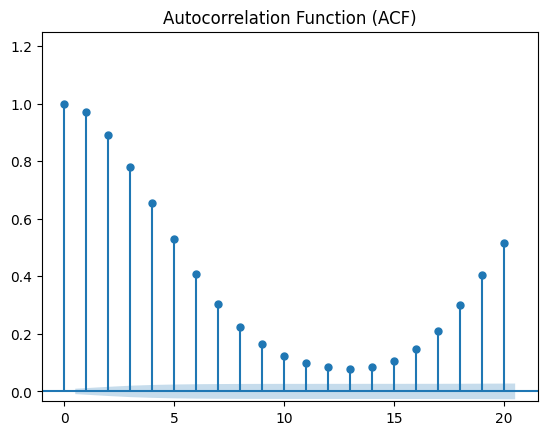

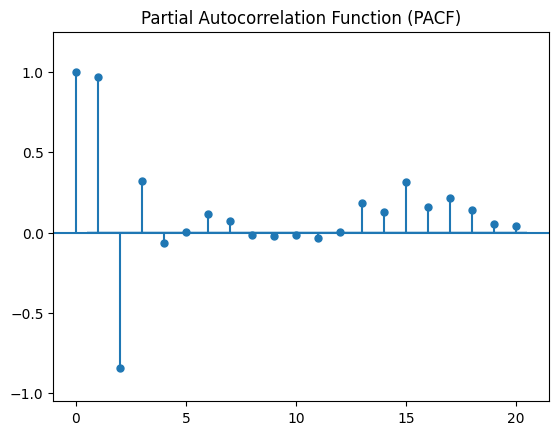

In [10]:
# Create ACF and PACF plots
# plt.figure(figsize=(12, 6))

# ACF plot
plot_acf(df["Actual Load [MW]"], auto_ylims= True, lags=20, ax=plt.gca())
plt.title("Autocorrelation Function (ACF)")
plt.show()

# PACF plot
plot_pacf(df["Actual Load [MW]"], auto_ylims= True, lags=20, ax=plt.gca(), method='ywm')
plt.title("Partial Autocorrelation Function (PACF)")
plt.show()

# time comparison

In [32]:
from datetime import datetime
# Folder path
folder_path = "outputs-copy"

# Fetch file names and creation times
files_data = []
for file_name in os.listdir(folder_path):
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        # creation_time = os.path.getctime(file_path)  # Get creation time
        creation_time = os.path.getmtime(file_path)
        creation_time = datetime.fromtimestamp(creation_time)  # Convert to readable format
        # Extract model name and start time
        model_name = file_name.split("_")[0]  # "AutoARIMA"
        raw_start_time = file_name.split("_")[-2] + "_" + file_name.split("_")[-1].replace(".csv", "")  # "2024-12-28_18-08"

        # Convert raw start time to datetime format
        start_time = datetime.strptime(raw_start_time, "%Y-%m-%d_%H-%M")  # Convert to datetime object

        files_data.append({"File Name": file_name,
                           "Model Name": model_name,
                           "Start time": start_time,
                           "Creation Time": creation_time})

# Create a DataFrame
df = pd.DataFrame(files_data)

# Save to Excel
output_file = "time_comparison_analysis.xlsx"
df.to_excel(output_file, index=False, engine="openpyxl")

print(f"File information saved to {output_file}")

File information saved to time_comparison_analysis2.xlsx


# Norm MAE box plot

In [26]:
import os
# Folder path
folder_path = "outputs-copy"
data = pd.read_csv(r"Enriched_data.csv")
data = data["Actual Load [MW]"][-720:]
actual_data = pd.DataFrame()
# Fetch file names and creation times
files_data = []
combined_data = pd.DataFrame()
for file_name in os.listdir(folder_path):
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        df = pd.read_csv(file_path)
        df = df[["forecast","split","model_name","training_horizon",]]
        combined_data = pd.concat([combined_data,df], ignore_index=True)
        actual_data = pd.concat([actual_data,data], ignore_index=True)

combined_data["Ground Truth"] = actual_data 

In [27]:
import pandas as pd
import numpy as np

data_norm_mae = []

for model_name in combined_data["model_name"].unique():
    for training_horizon in combined_data["training_horizon"].unique():
        # Filter rows matching the model name and training horizon
        df_trimmed = combined_data[
            (combined_data["model_name"] == model_name) &
            (combined_data["training_horizon"] == training_horizon)
        ]
        
        for split in range(1, 31):
            # Further filter by split
            df_split = df_trimmed[df_trimmed["split"] == split]
            
            if not df_split.empty:  # Ensure the filtered DataFrame is not empty
                # Calculate normalized MAE for all rows in this split
                norm_mae = (
                    np.abs(df_split["Ground Truth"] - df_split["forecast"]).sum() /
                    (df_split["Ground Truth"].max() * df_split.shape[0])
                )
                
                # Append the aggregated result as a dictionary
                data_norm_mae.append({
                    "model_name": model_name,
                    "training_horizon": str(training_horizon),
                    "split": split,
                    "norm_mae": norm_mae
                })

# Convert the results list to a DataFrame
data_norm_mae = pd.DataFrame(data_norm_mae)
data_norm_mae["training_horizon"] = data_norm_mae["training_horizon"].astype(str)


# Save to CSV (optional)
# data_norm_mae.to_csv("aggregated_norm_mae.csv", index=False)

# print(data_norm_mae)


In [28]:
# import plotly.graph_objects as go

# Create the initial plot for the first model
fig = go.Figure()

# Define the order of training horizons numerically, and convert them to string for category display
training_horizon_order = [336, 672, 1344, 2688, 5376, 8064]  # List the training horizons in ascending numeric order

# Iterate over each unique model
for model_name in data_norm_mae["model_name"].unique():
    # Filter data for the current model
    df_ = data_norm_mae[data_norm_mae["model_name"] == model_name].copy()  # Use .copy() to avoid SettingWithCopyWarning
    
    # Convert 'training_horizon' to string to treat as categories
    df_["training_horizon"] = df_["training_horizon"].astype(str)

    # Add a box plot trace for each model
    fig.add_trace(
        go.Box(
            x=df_["training_horizon"],
            y=df_["norm_mae"],
            name=model_name,  # Legend entry
            # boxmean='sd',  # Optionally add mean and standard deviation
        )
    )

# Update layout for better visualization
fig.update_layout(
    title="Comparison of Normalized MAE for Selected Models",
    xaxis_title="Training Horizon",
    yaxis_title="Normalized MAE",
    template="presentation",  # Clean look
    xaxis=dict(
        type="category",  # Treat x-axis as categorical
        categoryorder="array",  # Sort categories
        categoryarray=[str(x) for x in training_horizon_order],  # Set the custom order (converted to string)
    ),
    boxmode="group",  # Make sure the box plots appear side by side
    legend=dict(
        orientation="h",  # Horizontal layout
        x=0,  # Position the legend to the left
        y=1,  # Place it slightly above the plot
        xanchor="left",  # Anchor the legend on the left
        yanchor="bottom",  # Anchor it at the bottom
        traceorder="normal",  # Maintain the normal order of legend items
    )
)

fig.write_html("results/boxplot.html")
# Show the plot
fig.show()
